## Setup

In [1]:
%cd /kaggle/working

/kaggle/working


In [2]:
import requests
import tarfile
import os
import numpy as np
import cv2
from typing import List
import matplotlib.pyplot as plt
import random
import dlib

import tensorflow as tf
from tensorflow import keras
from tensorflow.data import Dataset
from tensorflow.data import AUTOTUNE
from tensorflow import TensorSpec
from tensorflow import dtypes

In [3]:
%pip install imgaug -U
import imgaug as ia
from imgaug import augmenters as iaa

Note: you may need to restart the kernel to use updated packages.


# Data Generator


In [4]:
%mkdir data_generator/
%cd data_generator/

/kaggle/working/data_generator


In [5]:
face_data_dir = '/kaggle/input/coml-photos-spencer/Face Photos Dataset'

In [6]:
!git clone https://github.com/krasserm/face-recognition.git

Cloning into 'face-recognition'...
remote: Enumerating objects: 173, done.
remote: Total 173 (delta 0), reused 0 (delta 0), pack-reused 173
Receiving objects: 100% (173/173), 16.84 MiB | 14.16 MiB/s, done.
Resolving deltas: 100% (29/29), done.


In [7]:
!mv face-recognition face_recognition

In [8]:
# download the face landmarks model for face alignment
import bz2
from face_recognition.align import AlignDlib
from urllib.request import urlopen

def download_landmarks(landmarks_path):
    url = 'http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2'
    decompressor = bz2.BZ2Decompressor()
    print("Starting download:", url)
    with urlopen(url) as src, open(landmarks_path, 'wb') as dst:
        data = src.read(1024)
        while len(data) > 0:
            dst.write(decompressor.decompress(data))
            data = src.read(1024)
    print("Downloaded to:", landmarks_path)

landmarks_dir = 'models'
landmarks_path = os.path.join(landmarks_dir, 'landmarks.dat')
if not os.path.exists(landmarks_path):
    os.makedirs(landmarks_dir)
    download_landmarks(landmarks_path)

Starting download: http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2
Downloaded to: models/landmarks.dat


In [9]:
class COMLFaceGenerator():
    def __init__(self, face_data_dir, aligned_face_dir=None, batch_size=4, anchor_shape=(96,96), n_channels=3, img_aug=False, face_align=False, landmarks_path=landmarks_path):
        self.face_data_dir = face_data_dir
        self.aligned_face_dir = aligned_face_dir
        self.batch_size = batch_size
        self.anchor_shape = anchor_shape
        self.n_channels = n_channels
        self.img_aug = img_aug
        self.face_align = face_align

        self.positive_pairs = []
        self.negative_pairs = []
        # get all peopl's images
        persons = os.listdir(face_data_dir)
        img_exts = ('.png','.jpg','.jpeg')


        for i, person in enumerate(persons):
            person_path = os.path.join(face_data_dir, person)
            person_files = os.listdir(person_path)
            image_files = [image_file for image_file in person_files if image_file.endswith(img_exts)]

            if len(image_files) >= 2:
                image_ids = np.arange(len(image_files))
                np.random.shuffle(image_ids)
                self.positive_pairs.append([(person, image_files[image_ids[0]]),(person,image_files[image_ids[1]])])
              
                remaining_persons = persons.copy()
                remaining_persons.pop(i)
            
                other_person = np.random.choice(remaining_persons)
                other_person_path = os.path.join(face_data_dir, other_person)
                other_person_files = os.listdir(other_person_path)
                other_person_image_files = [image_file for image_file in other_person_files if image_file.endswith(img_exts)]
                if len(other_person_image_files) >= 1:
                    random_id = random.randrange(len(other_person_image_files))
                    self.negative_pairs.append([(person,image_files[image_ids[0]]),(other_person,other_person_image_files[random_id])])


        min_len = min(len(self.positive_pairs), len(self.negative_pairs))
        self.pos_indexes = np.arange(min_len)
        self.neg_indexes = np.arange(min_len)
        self.alignment = AlignDlib(landmarks_path) # create the face alignment model
        self.augmenter = iaa.SomeOf(3, [ # create the image augmenter
            iaa.Crop(px=(0,16)), # crop images from each side by 0 to 16px (randomly chosen)
            iaa.Fliplr(0.5), # horizontally flip 50% of the images
            iaa.Rotate((-25, 25)),
            iaa.ShearX((-10, 10)),
            iaa.GaussianBlur(sigma=(0,1.0)), # blur images with a sigma of 0 to 3.0
            iaa.GammaContrast((0.5, 2.0)), # adjust the image contrast 
            # version incompatibility for scale
            iaa.ScaleX((0.8, 1.2)), # adjust scale in X axis
            iaa.ScaleY((0.8, 1.2)), # adjust scale in Y axis
        ])
    
    def __len__(self):
        return len(self.pos_indexes)

    # helper functions to load images
    def get_image_path(self, name, id):
        path_name = os.path.join(self.face_data_dir, name, id)
        return path_name

    def load_image(self, name, id):
        img = cv2.imread(self.get_image_path(name, id))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img.astype('float32')
        img = img / 255.0
        return img

    def load_aligned_image(self, name, id):
        img = cv2.imread(os.path.join(self.aligned_face_dir, name, id))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = img.astype('float32')
        img = img / 255.0
        return img       
    
    def augment_image(self, img):
        return self.augmenter(images=[img])[0]

    def align_image(self, img):
        img = (img*255).astype("uint8")
        alignment = self.alignment
        bb = alignment.getLargestFaceBoundingBox(img) # get face bounding box
        if bb is not None:
            paddingh = (int)(bb.width()*0.18)
            paddingv = (int)(bb.height()*0.18)
            left = bb.left() - paddingh
            right = bb.right() + paddingh
            top = bb.top() - paddingv
            bottom = bb.bottom() + paddingv
            bb2 = dlib.rectangle(left, top, right, bottom)
            img = alignment.align(self.anchor_shape[0],img,bb2,
                                    landmarkIndices=AlignDlib.OUTER_EYES_AND_NOSE)
        return img.astype("float32") / 255

    def __getitem__(self, index):
        pos_pair = self.positive_pairs[self.pos_indexes[index]]
        neg_pair = self.negative_pairs[self.neg_indexes[index]]
        pos_name, pos_id_1 = pos_pair[0]
        pos_name, pos_id_2 = pos_pair[1]
        neg_name, neg_id = neg_pair[0]
        if pos_name == neg_name:
            neg_name, neg_id = neg_pair[1]

        if self.face_align:
          if self.aligned_face_dir is not None:
            anchor_img = self.load_aligned_image(pos_name, pos_id_1)
            pos_img = self.load_aligned_image(pos_name, pos_id_2)
            neg_img = self.load_aligned_image(neg_name, neg_id)
          else:
            anchor_img = self.load_image(pos_name, pos_id_1)
            pos_img = self.load_image(pos_name, pos_id_2)
            neg_img = self.load_image(neg_name, neg_id)
            anchor_img = self.align_image(anchor_img)
            pos_img = self.align_image(pos_img)
            neg_img = self.align_image(neg_img)

        else:
            anchor_img = self.load_image(pos_name, pos_id_1)
            pos_img = self.load_image(pos_name, pos_id_2)
            neg_img = self.load_image(neg_name, neg_id)

        if self.img_aug:
            anchor_img = self.augment_image(anchor_img)
            pos_img = self.augment_image(pos_img)
            neg_img = self.augment_image(neg_img)

        anchor_img = cv2.resize(anchor_img, self.anchor_shape)
        pos_img = cv2.resize(pos_img, self.anchor_shape)
        neg_img = cv2.resize(neg_img, self.anchor_shape)
        
        return (anchor_img, pos_img, neg_img), None

    def generate(self):
        for index in self.pos_indexes:
            yield self[index]

    def get_generator(self):
        tfdatagen = Dataset.from_generator(
            # create a tf.Dataset generator using the generate method
            self.generate, 
            # define the outputs of the tf.Dataset generator
            output_signature=(
                # image shapes and datatypes
                (TensorSpec((self.anchor_shape[0], self.anchor_shape[1], self.n_channels), 
                            dtypes.float32),
                TensorSpec((self.anchor_shape[0], self.anchor_shape[1], self.n_channels), 
                            dtypes.float32),
                TensorSpec((self.anchor_shape[0], self.anchor_shape[1], self.n_channels), 
                            dtypes.float32)), TensorSpec(None))
        )
            
        return (tfdatagen
            # set the batch size
            .batch(self.batch_size)
            # shuffle to randomly select images
            .shuffle(self.batch_size*2)
            # prefetch for performance optimization
            .prefetch(AUTOTUNE)
            )

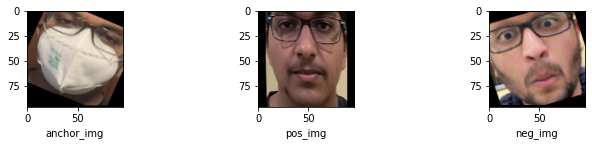

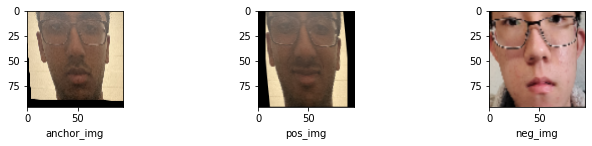

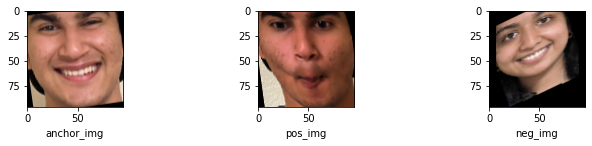

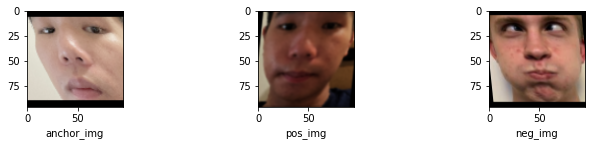

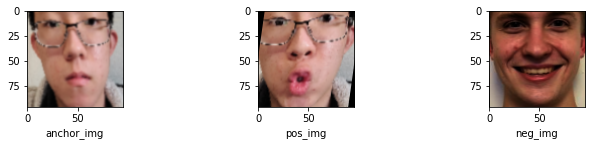

In [10]:
# Displaying a Batch of Augmented Images
data_generator_fire = COMLFaceGenerator(face_data_dir, face_align=True, img_aug=True)
# Display 5 sets of (anchor, positive, negative) from COML dataset
for i in range(5):
  plt.figure(figsize=(10,4))
  (anchor_img, pos_img, neg_img), _ = data_generator_fire[i]

  plt.subplot(1, 5, 1)
  plt.imshow(anchor_img)
  plt.xlabel("anchor_img")

  plt.subplot(1, 5, 3)
  plt.imshow(pos_img)
  plt.xlabel("pos_img")

  plt.subplot(1, 5, 5)
  plt.imshow(neg_img)
  plt.xlabel("neg_img")

  plt.show()

# Bounding boxes


In [11]:
%cd ../

/kaggle/working


In [12]:
%pwd

'/kaggle/working'

In [13]:
# Clone the detr github repo
!git clone https://github.com/facebookresearch/detr.git
import os
os.chdir('detr')
!git checkout 8a144f83a287f4d3fece4acdf073f387c5af387d

Cloning into 'detr'...
remote: Enumerating objects: 260, done.
remote: Total 260 (delta 0), reused 0 (delta 0), pack-reused 260
Receiving objects: 100% (260/260), 12.85 MiB | 13.16 MiB/s, done.
Resolving deltas: 100% (142/142), done.
Note: switching to '8a144f83a287f4d3fece4acdf073f387c5af387d'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

HEAD is now at 8a144f8 docs: add GH button in support of Ukraine (#490)


In [14]:
!pip install -U argparse
!pip install pycocotools

     |████████████████████████████████| 106 kB 523 kB/s            
  Installing build dependencies ... - \ | / - \ | / done
  Getting requirements to build wheel ... - \ | / done
  Preparing metadata (pyproject.toml) ... - \ | / done
  Created wheel for pycocotools: filename=pycocotools-2.0.4-cp37-cp37m-linux_x86_64.whl size=370025 sha256=bb7a647fbcf151c5a5cd56a01ec004eab75acb92945a2a516ecaf7005a303ca6
  Stored in directory: /root/.cache/pip/wheels/a3/5f/fa/f011e578cc76e1fc5be8dce30b3eb9fd00f337e744b3bba59b
Successfully built pycocotools


In [15]:
# Import required libraries
import argparse
import random
from pathlib import Path

import numpy as np
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import PIL.Image

import util.misc as utils
from models import build_model

from main import get_args_parser

In [16]:
# Setup the model arguement parser
%cd /kaggle/working
parser = argparse.ArgumentParser(description="DETR Args Parser", parents=[get_args_parser()])
args = parser.parse_args(args=[])
args.resume = '/kaggle/input/team2chkpts/ckpts/checkpoint.pth'
args.device = 'cpu'

if args.output_dir:
  Path(args.output_dir).mkdir(parents=True, exist_ok=True)

args.distributed = False

print(args)

/kaggle/working
Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path=None, dataset_file='coco', dec_layers=6, device='cpu', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=300, eval=False, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=0.0001, lr_backbone=1e-05, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_queries=100, num_workers=2, output_dir='', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='/kaggle/input/team2chkpts/ckpts/checkpoint.pth', seed=42, set_cost_bbox=5, set_cost_class=1, set_cost_giou=2, start_epoch=0, weight_decay=0.0001, world_size=1)


In [17]:
# Build model and define run device
model, criterion, postprocessors = build_model(args)

device = torch.device(args.device)
model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_f

In [18]:
# Download and load pretrained model weights
output_dir = Path(args.output_dir)
if args.resume:
  if args.resume.startswith('https'):
    checkpoint = torch.hub.load_state_dict_from_url(
        args.resume, map_location='cpu', check_hash=True
    )
  else:
    checkpoint = torch.load(
        args.resume, map_location='cpu'
    )
  model.load_state_dict(checkpoint['model'], strict=True)

In [19]:
# COCO Classes
CLASSES = [
   'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
   'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
   'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
   'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
   'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
   'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
   'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
   'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
   'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
   'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
   'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
   'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
   'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
   'toothbrush'
]

In [20]:
# Colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# Standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# For output bounding box post-processing
def box_cxcywh_to_xyxy(x):
  x_c, y_c, w, h = x.unbind(1)
  b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
        (x_c + 0.5 * w), (y_c + 0.5 * h)]
  return torch.stack(b, dim=1)

# Resize bounding boxes to be full size of the image
def rescale_bboxes(out_bbox, size):
  img_w, img_h = size
  b = box_cxcywh_to_xyxy(out_bbox)
  b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
  return b

In [21]:
def detect(im, model, transform):
  # Mean-STD Normalize the input image (of batch-size 1)
  img = transform(im).unsqueeze(0)
  # The demo model only supports images with aspect between 0.5 and 2.0
  # If you want to use images with an ratio outside this range,
  # Resize the image so the maximum size is at most 1333 for best results
  assert img.shape[-2] <= 1600 and img.shape[-1] <= 1600 # Demo model only supports images up to 1600 on each side.
  # Propogate through the model on the input image
  outputs = model(img)
  # Keep only the predictions with 0.7+ confidence
  # print(outputs['pred_logits'].softmax(-1))
  # print(outputs['pred_logits'].softmax(-1).shape)
  probas = outputs['pred_logits'].softmax(-1)[0,:,:-1]
  keep = probas.max(-1).values > 0.9
  # Convert bboxes from [0, 1] scale to image scale
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  # Return probabilities and scaled bboxes
  return probas[keep], bboxes_scaled

In [22]:
def plot_results(pil_img, class_probs, b_boxes, classes, is_ground_truth=False):
  plt.figure(figsize=(16,10))
  plt.axis('off')
  ax = plt.gca()
  ax.imshow(pil_img)
    
  for p, (xmin, ymin, xmax, ymax), c in zip(class_probs, b_boxes, COLORS * 100):
    cl = p if is_ground_truth else p.argmax()
        
    # If the class isn't present, skip this annotation
    if CLASSES[cl] not in classes:
      continue
    # Plot bounding box and label (Note difference in bounding box format, xmax vs xmax-xmin)
    xmax = xmax if is_ground_truth else xmax-xmin
    ymax = ymax if is_ground_truth else ymax-ymin
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax, ymax, fill=False, color=c, linewidth=1))

    text = f"{CLASSES[cl]}" if is_ground_truth else f"{CLASSES[cl]}: {p[cl]:0.2f}"
    # ax.text(xmin,ymin, text, fontsize=15, bbox=dict(facecolor="yellow", alpha=0.5))

  # Show the plot
  plt.show()


/opt/conda/lib/python3.7/site-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  /usr/local/src/pytorch/aten/src/ATen/native/BinaryOps.cpp:461.)
  return torch.floor_divide(self, other)


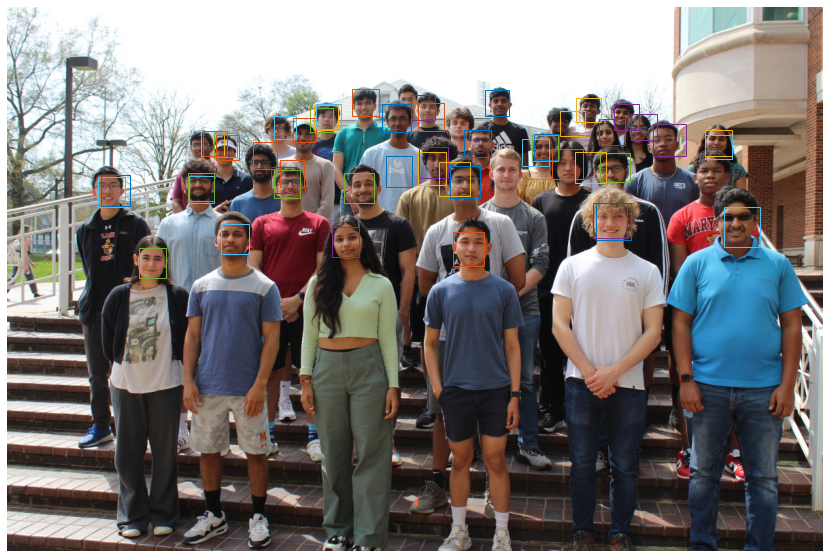

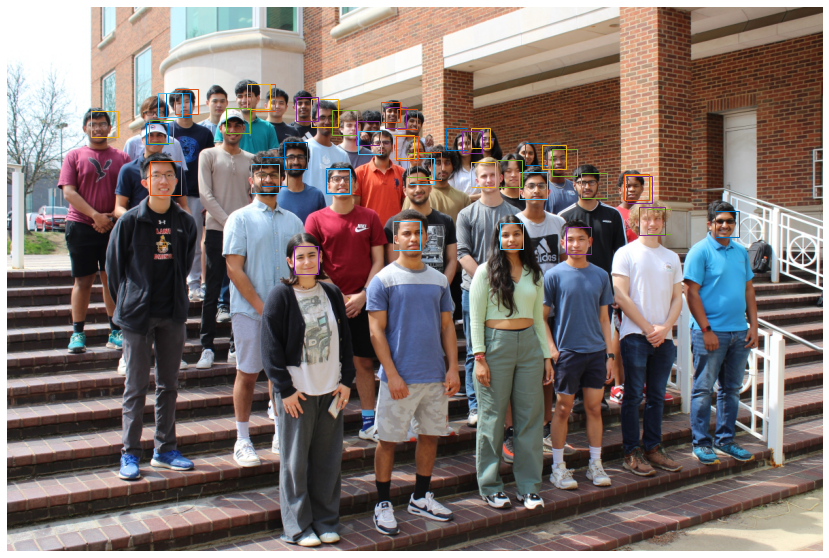

In [23]:
# for fname, dims in [
#               ('/content/photo-students-2021.webp', (1536//2, 1345//2)),
#               # ('/content/photo-students-2020.webp', (1920//2, 869//2)),
#               # ('/content/photo-students-2019.webp', (1918//2, 851//2)),
#               # ('/content/photo-students-2018.webp', (1920//2, 851//2)),
#               ]:
#   # Get category_id and bbox for every annotation with a matching image_id
#   # Open the image using the file_name

fnameb = '/kaggle/input/2022-spring-coml-facial-recognition-competition/b.JPG'
fnamea = '/kaggle/input/2022-spring-coml-facial-recognition-competition/a.JPG'
the_imageb = PIL.Image.open(fnameb).convert('RGB')
the_imagea = PIL.Image.open(fnamea).convert('RGB')
# Get the scores and bounding boxes from the detect function
scoresb, boxesb = detect(the_imageb, model, transform)
scoresa, boxesa = detect(the_imagea, model, transform)




# Plot results
plot_classes = ['person']
plot_results(the_imageb, scoresb, boxesb.tolist(), plot_classes)
plot_results(the_imagea, scoresa, boxesa.tolist(), plot_classes)

In [24]:
width, height = the_imageb.size
facesb = [(
            the_imageb.crop((int(box[0]),int(box[1]),int(box[2]),int(box[3]))),
            float(score[1]),
            (box[0]/width, box[2]/width, box[1]/height, box[3]/height)
          ) for box, score in zip(boxesb, scoresb)]

width, height = the_imagea.size
facesa = [(
            the_imagea.crop((int(box[0]),int(box[1]),int(box[2]),int(box[3]))),
            float(score[1]),
            (box[0]/width, box[2]/width, box[1]/height, box[3]/height)
          ) for box, score in zip(boxesa, scoresa)]


# Want to find the max number for the boxes around each person


# Facial Recognition

In [25]:
%cd /kaggle/working
%mkdir frec
%cd frec

/kaggle/working
/kaggle/working/frec


In [26]:
os.mkdir("aligned_coml_faces")
aligned_face_dir = '/kaggle/working/frec/aligned_coml_faces'

In [27]:
# Initialize the data generator
landmarks_path = '../data_generator/models/landmarks.dat'
batchsize = 4 # Number of tuples in each batch
generator = COMLFaceGenerator(face_data_dir, 
                             aligned_face_dir=aligned_face_dir,
                             batch_size=batchsize, 
                             img_aug = True, 
                             face_align=True,
                             landmarks_path=landmarks_path)

In [28]:
# pre-aligns face images and saves them to speed up training


persons = os.listdir(face_data_dir)
img_exts = ('.png','.jpg','.jpeg')

for i, person in enumerate(persons):
  os.mkdir(os.path.join(aligned_face_dir, person))
  person_path = os.path.join(face_data_dir, person)
  person_files = os.listdir(person_path)
  image_files = [image_file for image_file in person_files if image_file.endswith(img_exts)]
  print(person)
  for id in image_files:
    img = generator.load_image(person, id)
    img = generator.align_image(img)
    img = (img*255).astype("uint8")
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    cv2.imwrite(os.path.join(aligned_face_dir, person, id), img)

Adil Kasim
Saatvik Vadlapatla
Ishan Tripathi
Jiarui Li
Steven Zhang
Saketh Jakka
Arihant Gupta
Vikas Reddy
Ananya Nagireddy
Austin Cairns Sankanung
Parthiv Deb
Nathan Tablang
Avik Rao
Varun Jonnavithula
Margeret Akande
Nandini Shah
Andrew Lee
Erik Lin
Kieran Johnston
Brian Jacob
Gayatri Gopavajhala
Sriram Somasundaram Senthil
Rahul Dagar
Sahan Metpally
Pranav Dulepet
Felix Gu
Spencer Lutz
Gourav Saigal
Urvi Chauhan
Kofi Boateng
Naomi Rosenbaum
Stephane Mbenga
Tejas Chandakkar
James Dawkins
Garrett Beebe
Rishiraj Ghosh
Hardik Bhardwaj
Rishi Pradeep
Karan Agarwal
Krisha Gandhi


In [29]:
import matplotlib.patches as patches

from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Input, Layer
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [30]:
class TripletLossLayer(Layer):
  def __init__(self, alpha, **kwargs):
    self.alpha = alpha
    super(TripletLossLayer, self).__init__(**kwargs)

  def get_config(self):
    config = super().get_config().copy()
    config.update({'alpha': self.alpha})
    return config
  
  def triplet_loss(self, inputs):
    a, p, n = inputs
    p_dist = K.sum(K.square(a-p), axis=-1)
    n_dist = K.sum(K.square(a-n), axis=-1)
    return K.sum(K.maximum(p_dist - n_dist + self.alpha, 0), axis=0)
    #return K.sum(p_dist - n_dist + self.alpha, axis=0)

  def call(self, inputs):
    loss = self.triplet_loss(inputs)
    self.add_loss(loss)
    return loss

In [31]:
# Input for anchor, positive, and negative images
in_a = Input(shape=(96, 96, 3), name="img_a")
in_p = Input(shape=(96, 96, 3), name="img_p")
in_n = Input(shape=(96, 96, 3), name="img_n")

base_cnn = EfficientNetB1(input_shape=(96, 96, 3), include_top=False)
base_cnn.trainable = False

flatten = layers.Flatten()(base_cnn.output)
dense = layers.Dense(512, activation="relu")(flatten)
dense = layers.BatchNormalization()(dense)
dense2 = layers.Dense(320, activation="relu")(dense)
dense2 = layers.BatchNormalization()(dense2)
dense3 = layers.Dense(224, activation="relu")(dense2)
dense3 = layers.BatchNormalization()(dense3)
dense4 = layers.Dense(176, activation="relu")(dense3)
dense4 = layers.BatchNormalization()(dense4)
output = layers.Dense(128)(dense4)

embedding = Model(base_cnn.input, output, name="Embedding")

emb_a = embedding(in_a)
emb_p = embedding(in_p)
emb_n = embedding(in_n)

triplet_loss_layer = TripletLossLayer(alpha=0.2, name='triplet_loss_layer')([emb_a, emb_p, emb_n])

Model = Model([in_a, in_p, in_n], triplet_loss_layer)
Model.compile(loss=None, optimizer='adam')
Model.summary()

2022-04-27 15:14:00.478427: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-27 15:14:00.479786: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-27 15:14:00.480586: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-27 15:14:00.481650: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

27033600/27018416 [==============================] - 1s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_a (InputLayer)              [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
img_p (InputLayer)              [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
img_n (InputLayer)              [(None, 96, 96, 3)]  0                                            
__________________________________________________________________________________________________
Embedding (Functional)          (None, 128)          12777239    img_a[0][0]                      
                             

In [32]:
# using if 0: so that it won't train and just load weights in the next cell.
if 0:
    EPOCHS = 1000 # Maximum number of epochs

    # Train model on dataset
    # ModelCheckpoint will automatically save the best model
    # EarlyStopping will automatically stop when it stops improving

    Model.fit(generator.get_generator(), 
        epochs = EPOCHS,
        callbacks=[ModelCheckpoint(filepath='ckpts/Training6/epoch{epoch:03d}_loss{loss:.3f}.hdf5',
                                    monitor = 'loss',
                                    save_best_only = True,
                                    mode = 'auto',
                                    save_weights_only = True,
                                    verbose = 1),
                    # EarlyStopping(monitor='loss',
                    #               mode='auto',
                    #               patience=100,
                    #               verbose=True)
                    ])

In [33]:
Model.load_weights('/kaggle/input/team-2-files/epoch974_loss0.753.hdf5') #dont use these weights
base_model = Model.get_layer("Embedding")

In [34]:
def embedding_distance(embedding1, embedding2):
  # Return L2 distance
  return np.sum(np.square(embedding1 - embedding2))

In [35]:
def preprocess_image(img_path="", no_path=False, image=None, img_aug=True, face_align=True, target_shape=(96,96)):
    if no_path:
      img = np.array(image)
    else:
      img = cv2.imread(img_path)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if face_align:
        img = generator.align_image(img)
    else:
        img = img.astype("float32") / 255

    if img_aug:
        img = generator.augment_image(img)

    img = cv2.resize(img, target_shape)
    img = np.expand_dims(img,axis = 0)

    return img

In [36]:
face_data_dir = '/kaggle/input/coml-photos-spencer/Face Photos Dataset'
persons = os.listdir(face_data_dir)
img_exts = ('.png','.jpg','.jpeg')
coml_person_imgs = []
for i, person in enumerate(persons):
  person_path = os.path.join(face_data_dir, person)
  person_files = os.listdir(person_path)
  for image_file in person_files:
    if image_file.endswith(img_exts):
      coml_person_imgs.append((person, os.path.join(person_path, image_file)))
print(coml_person_imgs)

[('Adil Kasim', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Adil Kasim/smiling.jpg'), ('Adil Kasim', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Adil Kasim/funny.jpg'), ('Adil Kasim', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Adil Kasim/neutral.jpg'), ('Adil Kasim', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Adil Kasim/mask.jpg'), ('Saatvik Vadlapatla', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Saatvik Vadlapatla/IMG_5606 Cropped.jpg'), ('Saatvik Vadlapatla', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Saatvik Vadlapatla/IMG_5608 Cropped.jpg'), ('Saatvik Vadlapatla', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Saatvik Vadlapatla/IMG_5607 Cropped.jpg'), ('Ishan Tripathi', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Ishan Tripathi/Screen Shot 2022-02-22 at 10.05.25 PM.png'), ('Ishan Tripathi', '/kaggle/input/coml-photos-spencer/Face Photos Dataset/Ishan Tripathi/Screen Shot 2022-02-22 at 10.05.14

In [37]:
embeddings = []
for person, img in coml_person_imgs:
  try:
    embeddings.append((base_model.predict(preprocess_image(img, img_aug=False)), person, img))
  except Exception:
    print("FAILED:", person, img)

2022-04-27 15:14:14.467278: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-04-27 15:14:16.951203: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


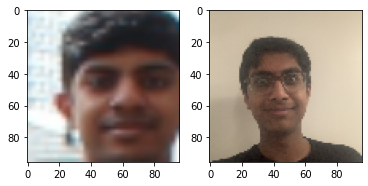

Confidence of BB: 0.9848565459251404. Most similar person and embedding distance: Rishi Pradeep, 0.0001127671348513104


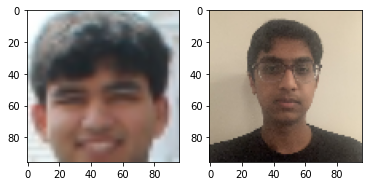

Confidence of BB: 0.9932651519775391. Most similar person and embedding distance: Rishi Pradeep, 0.00040858681313693523


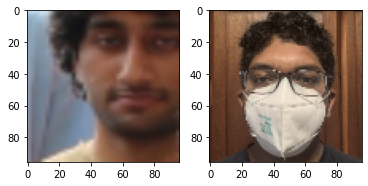

Confidence of BB: 0.9083641767501831. Most similar person and embedding distance: Adil Kasim, 1.76981084223371e-05


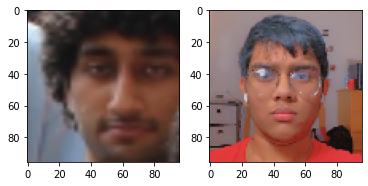

Confidence of BB: 0.9759516716003418. Most similar person and embedding distance: Karan Agarwal, 8.088417234830558e-05


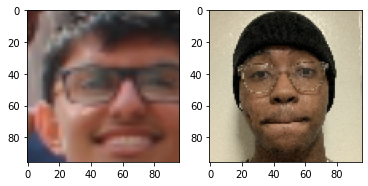

Confidence of BB: 0.9903280138969421. Most similar person and embedding distance: Kofi Boateng, 0.0001502498926129192


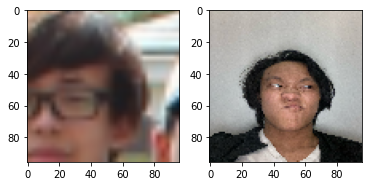

Confidence of BB: 0.984430730342865. Most similar person and embedding distance: Felix Gu, 2.2086553144617938e-05


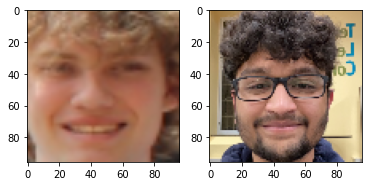

Confidence of BB: 0.9966570138931274. Most similar person and embedding distance: Pranav Dulepet, 5.058188980910927e-05


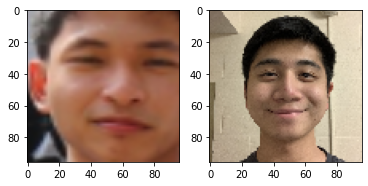

Confidence of BB: 0.9970368146896362. Most similar person and embedding distance: Austin Cairns Sankanung, 3.0074625101406127e-05


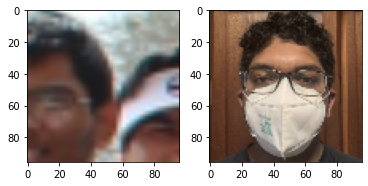

Confidence of BB: 0.9482060074806213. Most similar person and embedding distance: Adil Kasim, 3.083875708398409e-05


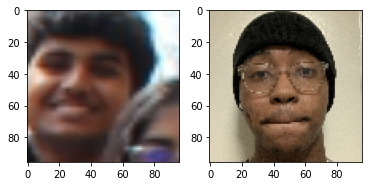

Confidence of BB: 0.9769704341888428. Most similar person and embedding distance: Kofi Boateng, 0.0001429112016921863


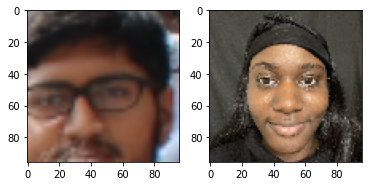

Confidence of BB: 0.9935990571975708. Most similar person and embedding distance: Margeret Akande, 1.1959276889683679e-05


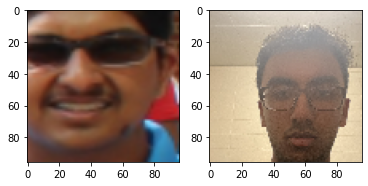

Confidence of BB: 0.9957624077796936. Most similar person and embedding distance: Saatvik Vadlapatla, 2.101670906995423e-05


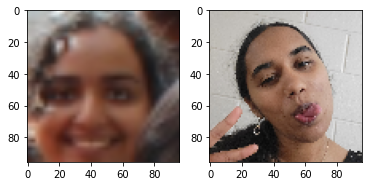

Confidence of BB: 0.947696328163147. Most similar person and embedding distance: Gayatri Gopavajhala, 0.0001728520728647709


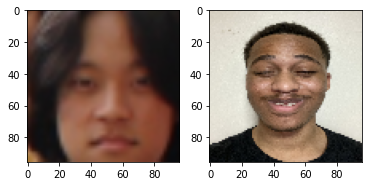

Confidence of BB: 0.9891754984855652. Most similar person and embedding distance: Stephane Mbenga, 0.000229794139158912


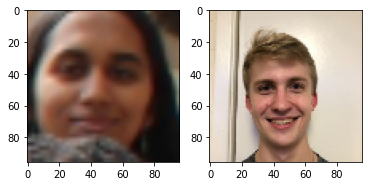

Confidence of BB: 0.995797872543335. Most similar person and embedding distance: Kieran Johnston, 3.144728907500394e-05


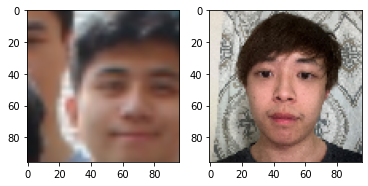

Confidence of BB: 0.9762401580810547. Most similar person and embedding distance: Erik Lin, 0.0001888278784463182


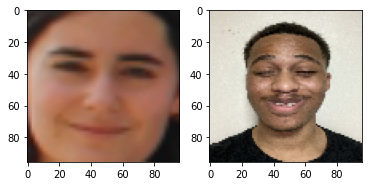

Confidence of BB: 0.98710697889328. Most similar person and embedding distance: Stephane Mbenga, 0.00021866733732167631


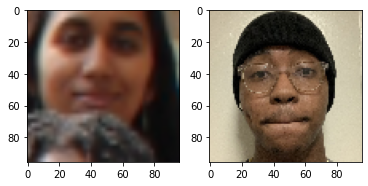

Confidence of BB: 0.9349595904350281. Most similar person and embedding distance: Kofi Boateng, 0.00011157356493640691


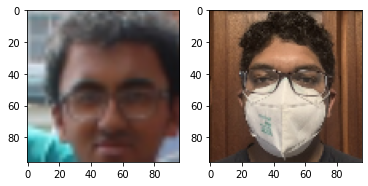

Confidence of BB: 0.9851037859916687. Most similar person and embedding distance: Adil Kasim, 0.001307015074416995


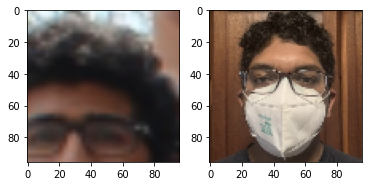

Confidence of BB: 0.905185341835022. Most similar person and embedding distance: Adil Kasim, 0.0010954895988106728


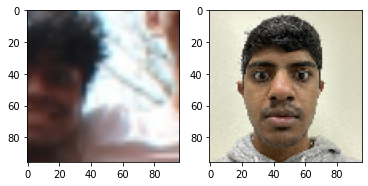

Confidence of BB: 0.9316815137863159. Most similar person and embedding distance: Brian Jacob, 0.00010088805720442906


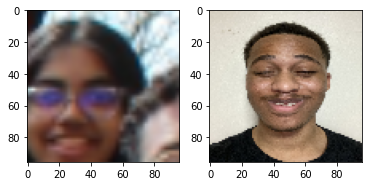

Confidence of BB: 0.9629619717597961. Most similar person and embedding distance: Stephane Mbenga, 2.345600296393968e-05


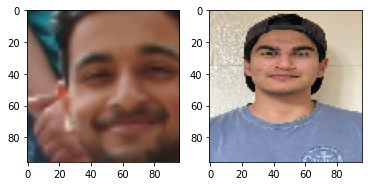

Confidence of BB: 0.9761365652084351. Most similar person and embedding distance: Ishan Tripathi, 7.498618651879951e-05


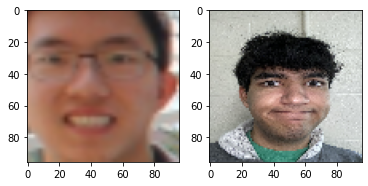

Confidence of BB: 0.9814755916595459. Most similar person and embedding distance: Avik Rao, 4.282140071154572e-05


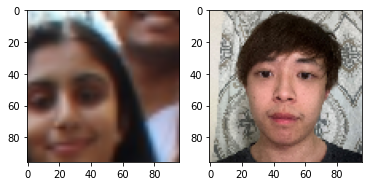

Confidence of BB: 0.9909549355506897. Most similar person and embedding distance: Erik Lin, 0.0002448447048664093


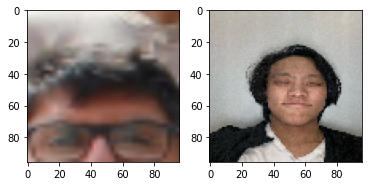

Confidence of BB: 0.9510616064071655. Most similar person and embedding distance: Felix Gu, 0.00043972369167022407


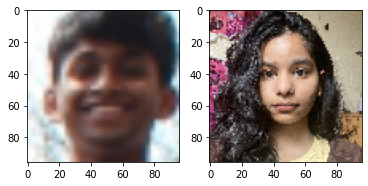

Confidence of BB: 0.9900951385498047. Most similar person and embedding distance: Urvi Chauhan, 4.074455500813201e-05


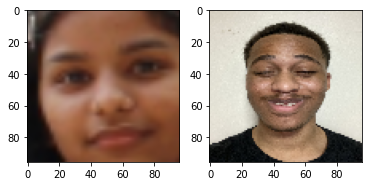

Confidence of BB: 0.9877610206604004. Most similar person and embedding distance: Stephane Mbenga, 6.430481880670413e-05


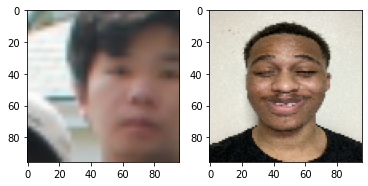

Confidence of BB: 0.9581010937690735. Most similar person and embedding distance: Stephane Mbenga, 9.756645886227489e-05


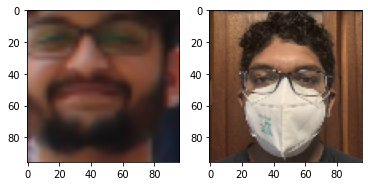

Confidence of BB: 0.9544839262962341. Most similar person and embedding distance: Adil Kasim, 0.0002003982081077993


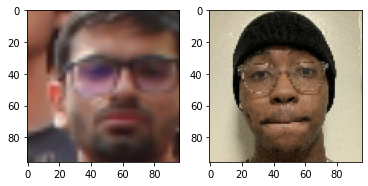

Confidence of BB: 0.98084557056427. Most similar person and embedding distance: Kofi Boateng, 2.053142452496104e-05


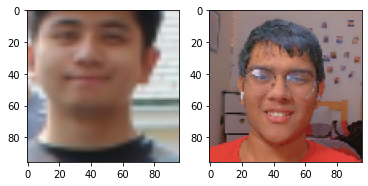

Confidence of BB: 0.9786175489425659. Most similar person and embedding distance: Karan Agarwal, 0.00011226003698538989


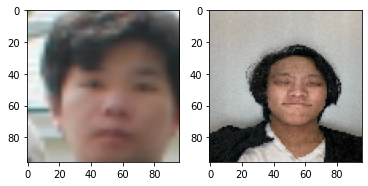

Confidence of BB: 0.9630403518676758. Most similar person and embedding distance: Felix Gu, 0.0002798687492031604


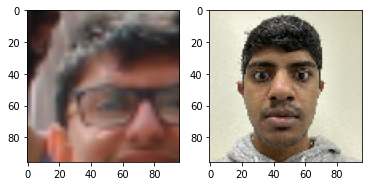

Confidence of BB: 0.9093949198722839. Most similar person and embedding distance: Brian Jacob, 0.00010494619345990941


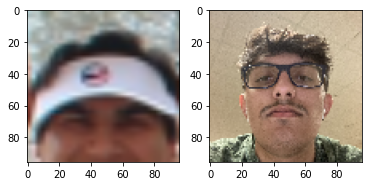

Confidence of BB: 0.933001697063446. Most similar person and embedding distance: Hardik Bhardwaj, 4.5910055632703006e-05


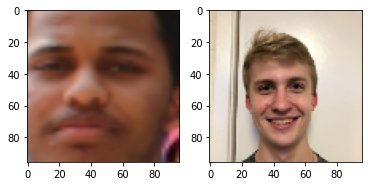

Confidence of BB: 0.9864967465400696. Most similar person and embedding distance: Kieran Johnston, 2.0167635739198886e-05


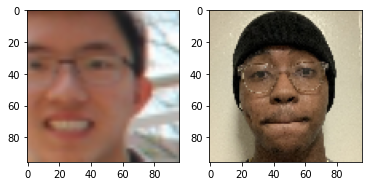

Confidence of BB: 0.9744978547096252. Most similar person and embedding distance: Kofi Boateng, 2.285915434185881e-05


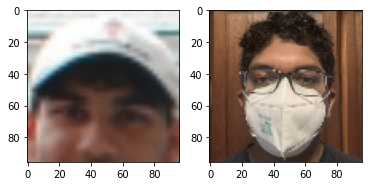

Confidence of BB: 0.9677330255508423. Most similar person and embedding distance: Adil Kasim, 0.0009757807711139321


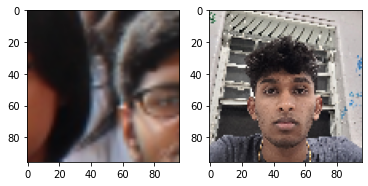

Confidence of BB: 0.9894941449165344. Most similar person and embedding distance: Saketh Jakka, 0.00025021907640621066


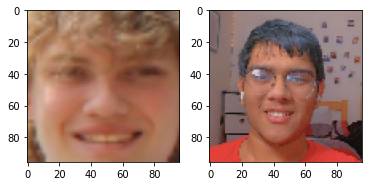

Confidence of BB: 0.945185661315918. Most similar person and embedding distance: Karan Agarwal, 6.738625233992934e-05


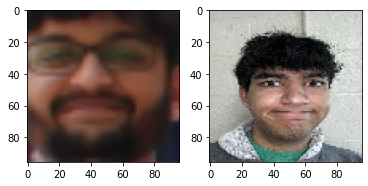

Confidence of BB: 0.9677639603614807. Most similar person and embedding distance: Avik Rao, 8.603402238804847e-05


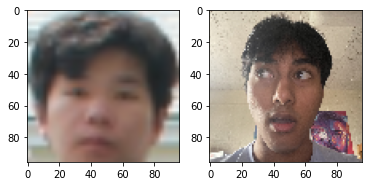

Confidence of BB: 0.9040250778198242. Most similar person and embedding distance: Rishiraj Ghosh, 0.00016666424926370382


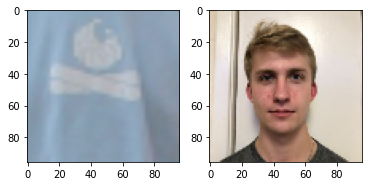

Confidence of BB: 0.9625546336174011. Most similar person and embedding distance: Kieran Johnston, 0.0010075283935293555


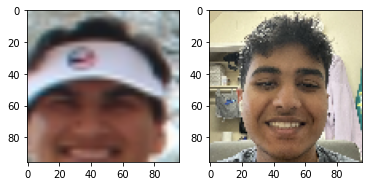

Confidence of BB: 0.9825520515441895. Most similar person and embedding distance: Sahan Metpally, 3.3944575989153236e-05


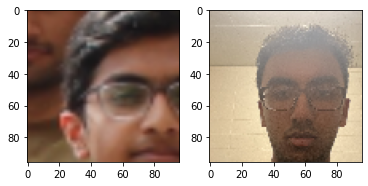

Confidence of BB: 0.9850778579711914. Most similar person and embedding distance: Saatvik Vadlapatla, 8.215765410568565e-05


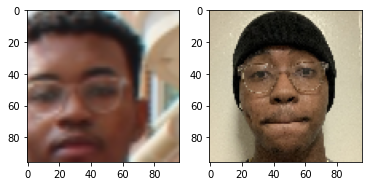

Confidence of BB: 0.9876317381858826. Most similar person and embedding distance: Kofi Boateng, 2.7546120691113174e-05


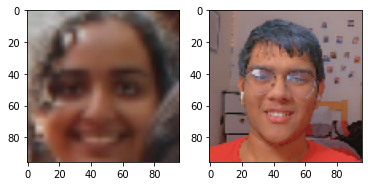

Confidence of BB: 0.9340255856513977. Most similar person and embedding distance: Karan Agarwal, 9.263544598070439e-06


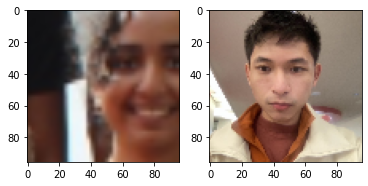

Confidence of BB: 0.9875348806381226. Most similar person and embedding distance: Nathan Tablang, 1.1869800800923258e-05


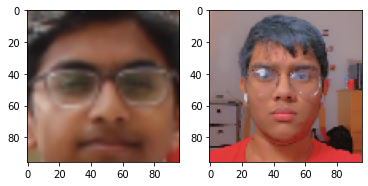

Confidence of BB: 0.9906608462333679. Most similar person and embedding distance: Karan Agarwal, 4.182574411970563e-05


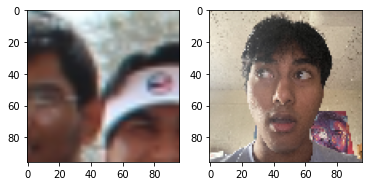

Confidence of BB: 0.9568539261817932. Most similar person and embedding distance: Rishiraj Ghosh, 6.543695053551346e-05


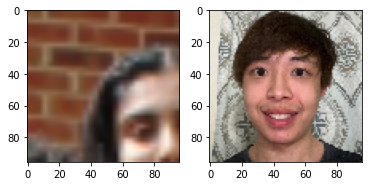

Confidence of BB: 0.9747159481048584. Most similar person and embedding distance: Erik Lin, 3.7378777051344514e-05


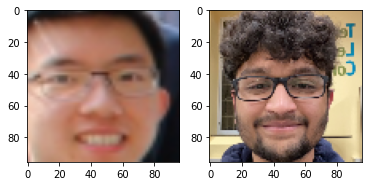

Confidence of BB: 0.9958292841911316. Most similar person and embedding distance: Pranav Dulepet, 2.728755134739913e-05


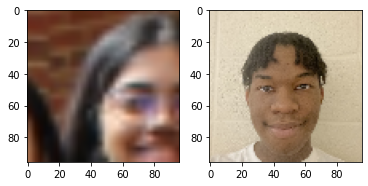

Confidence of BB: 0.9683390855789185. Most similar person and embedding distance: James Dawkins, 2.4563136321376078e-05


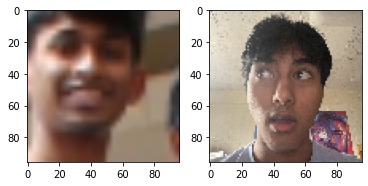

Confidence of BB: 0.968877911567688. Most similar person and embedding distance: Rishiraj Ghosh, 0.00013912428403273225


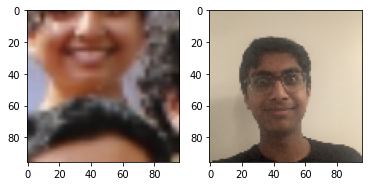

Confidence of BB: 0.982355535030365. Most similar person and embedding distance: Rishi Pradeep, 7.674616790609434e-05


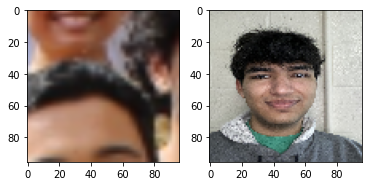

Confidence of BB: 0.9841883182525635. Most similar person and embedding distance: Avik Rao, 9.491584205534309e-05


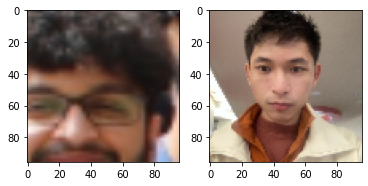

Confidence of BB: 0.9179509878158569. Most similar person and embedding distance: Nathan Tablang, 7.136309432098642e-05


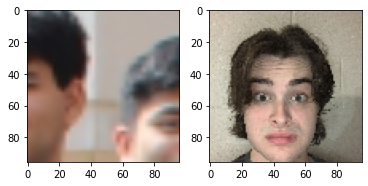

Confidence of BB: 0.9607901573181152. Most similar person and embedding distance: Garrett Beebe, 4.0584207454230636e-05


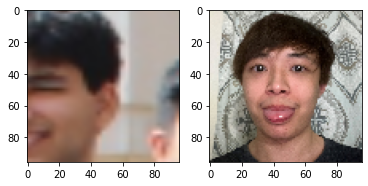

Confidence of BB: 0.9564750790596008. Most similar person and embedding distance: Erik Lin, 3.6581215681508183e-05


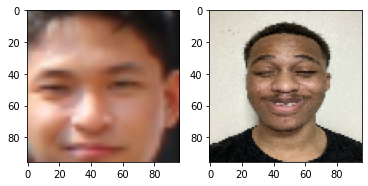

Confidence of BB: 0.9948754906654358. Most similar person and embedding distance: Stephane Mbenga, 6.538071465911344e-05


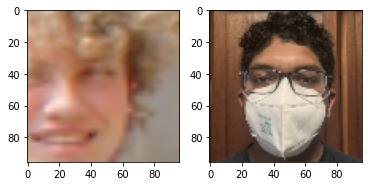

Confidence of BB: 0.9083350896835327. Most similar person and embedding distance: Adil Kasim, 0.0011876256903633475


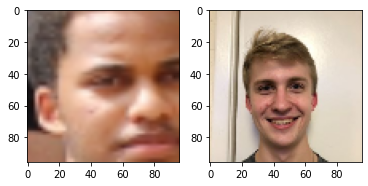

Confidence of BB: 0.9919558763504028. Most similar person and embedding distance: Kieran Johnston, 6.356713583954843e-06


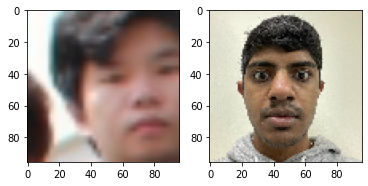

Confidence of BB: 0.9715040326118469. Most similar person and embedding distance: Brian Jacob, 2.6144782168557867e-05


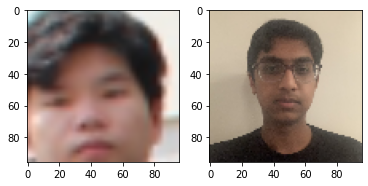

Confidence of BB: 0.952483057975769. Most similar person and embedding distance: Rishi Pradeep, 0.00015494527178816497


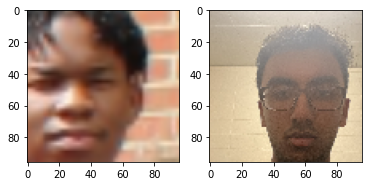

Confidence of BB: 0.9797955751419067. Most similar person and embedding distance: Saatvik Vadlapatla, 6.0396727349143475e-05


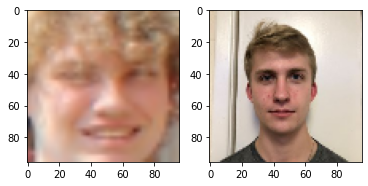

Confidence of BB: 0.977371335029602. Most similar person and embedding distance: Kieran Johnston, 0.00039560231380164623


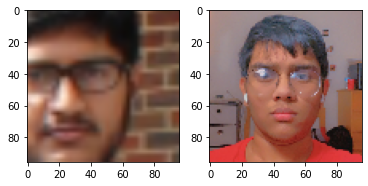

Confidence of BB: 0.9704327583312988. Most similar person and embedding distance: Karan Agarwal, 2.6791691198013723e-05


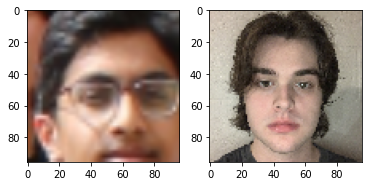

Confidence of BB: 0.9927003979682922. Most similar person and embedding distance: Garrett Beebe, 2.898126513173338e-05


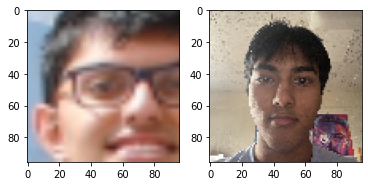

Confidence of BB: 0.9557155966758728. Most similar person and embedding distance: Rishiraj Ghosh, 0.0005847201100550592


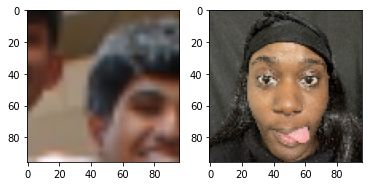

Confidence of BB: 0.962617039680481. Most similar person and embedding distance: Margeret Akande, 7.349163934122771e-05


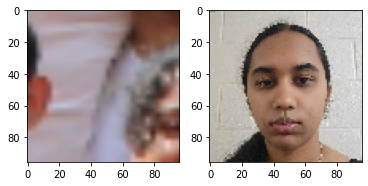

Confidence of BB: 0.9376181364059448. Most similar person and embedding distance: Gayatri Gopavajhala, 4.493358210311271e-05


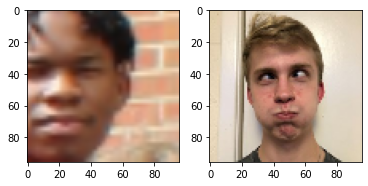

Confidence of BB: 0.991385817527771. Most similar person and embedding distance: Kieran Johnston, 7.439401815645397e-05


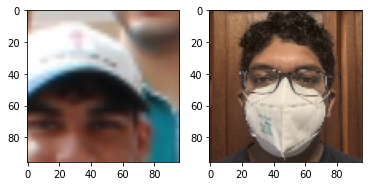

Confidence of BB: 0.9793035984039307. Most similar person and embedding distance: Adil Kasim, 0.0015432504005730152


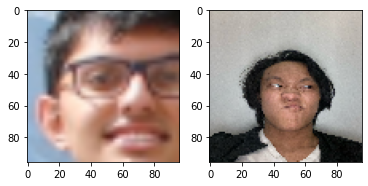

Confidence of BB: 0.9851509928703308. Most similar person and embedding distance: Felix Gu, 0.0001188886963063851


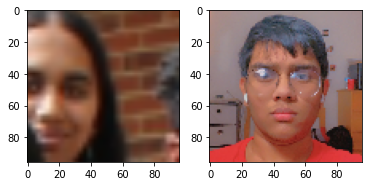

Confidence of BB: 0.9638643860816956. Most similar person and embedding distance: Karan Agarwal, 1.6157118807313964e-05


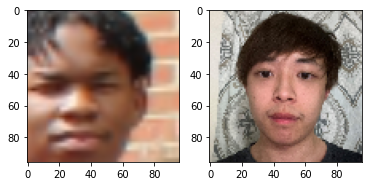

Confidence of BB: 0.9581854343414307. Most similar person and embedding distance: Erik Lin, 1.749232251313515e-05


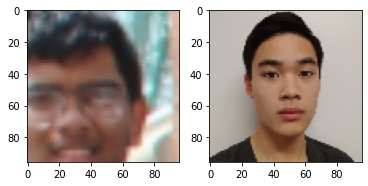

Confidence of BB: 0.9884541630744934. Most similar person and embedding distance: Andrew Lee, 4.742957389680669e-05


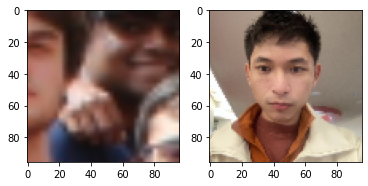

Confidence of BB: 0.9036850333213806. Most similar person and embedding distance: Nathan Tablang, 2.964633131341543e-05


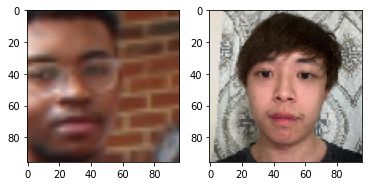

Confidence of BB: 0.9924259185791016. Most similar person and embedding distance: Erik Lin, 9.766308357939124e-05


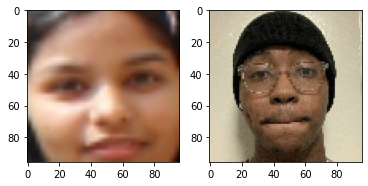

Confidence of BB: 0.9960837364196777. Most similar person and embedding distance: Kofi Boateng, 0.0006303049740381539


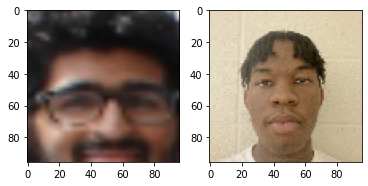

Confidence of BB: 0.9723691344261169. Most similar person and embedding distance: James Dawkins, 4.8098696424858645e-05


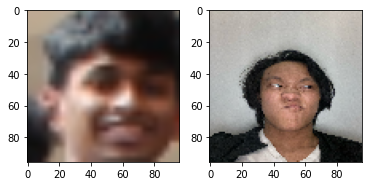

Confidence of BB: 0.9241731762886047. Most similar person and embedding distance: Felix Gu, 2.8509202820714563e-05


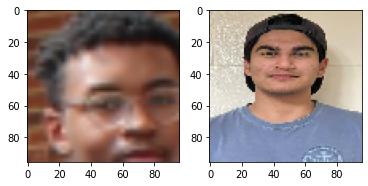

Confidence of BB: 0.9696182012557983. Most similar person and embedding distance: Ishan Tripathi, 9.807095193536952e-05


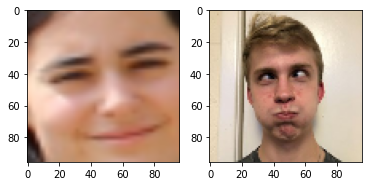

Confidence of BB: 0.9766672849655151. Most similar person and embedding distance: Kieran Johnston, 0.0002393560716882348


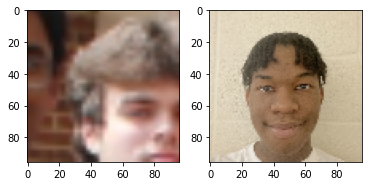

Confidence of BB: 0.9582241177558899. Most similar person and embedding distance: James Dawkins, 1.9998333300463855e-05


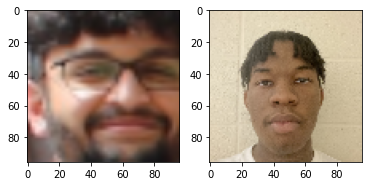

Confidence of BB: 0.9864903688430786. Most similar person and embedding distance: James Dawkins, 9.767545270733535e-05


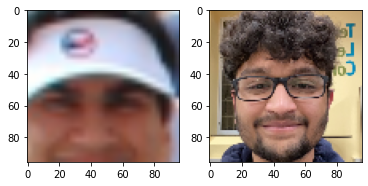

Confidence of BB: 0.965448796749115. Most similar person and embedding distance: Pranav Dulepet, 8.653201803099364e-05


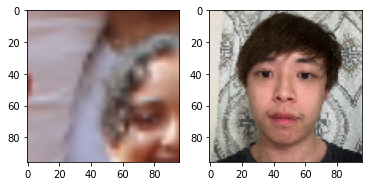

Confidence of BB: 0.9799600839614868. Most similar person and embedding distance: Erik Lin, 0.00018068854114972055


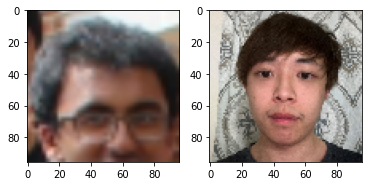

Confidence of BB: 0.9877249598503113. Most similar person and embedding distance: Erik Lin, 0.00019589732983149588


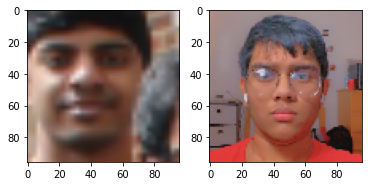

Confidence of BB: 0.9117322564125061. Most similar person and embedding distance: Karan Agarwal, 0.00012807251187041402


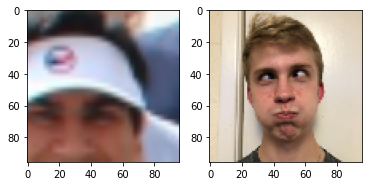

Confidence of BB: 0.9274991154670715. Most similar person and embedding distance: Kieran Johnston, 0.0005778714548796415


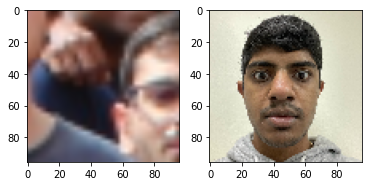

Confidence of BB: 0.9814250469207764. Most similar person and embedding distance: Brian Jacob, 2.3555672669317573e-05


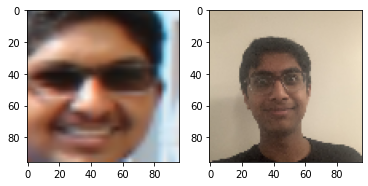

Confidence of BB: 0.9966711401939392. Most similar person and embedding distance: Rishi Pradeep, 0.0011636565905064344


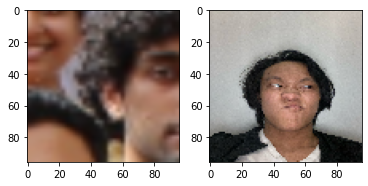

Confidence of BB: 0.9720488786697388. Most similar person and embedding distance: Felix Gu, 0.00014074030332267284


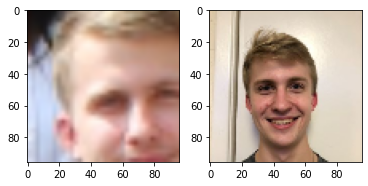

Confidence of BB: 0.9815643429756165. Most similar person and embedding distance: Kieran Johnston, 0.0003077707951888442


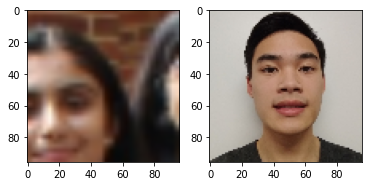

Confidence of BB: 0.9373628497123718. Most similar person and embedding distance: Andrew Lee, 4.71985295007471e-05


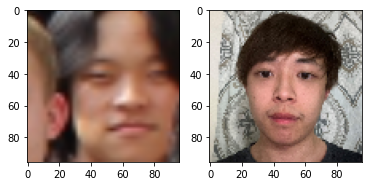

Confidence of BB: 0.9933822154998779. Most similar person and embedding distance: Erik Lin, 4.7024583182064816e-05


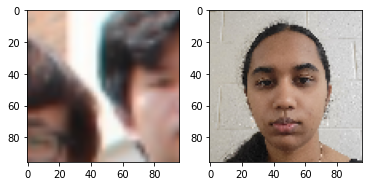

Confidence of BB: 0.937211811542511. Most similar person and embedding distance: Gayatri Gopavajhala, 5.915114525123499e-05


In [38]:
# found_images = [os.path.join('/content/drive/MyDrive/FIRE198/ASN6/found_images', name) # This is temporary and comes from my drive
#     for name in os.listdir('/content/drive/MyDrive/FIRE198/ASN6/found_images')]

labeled_bbsb = []
for img, score, box in facesb: #faces will come from the detection model
    
    processed_img = preprocess_image(no_path=True, image=img, face_align=False, img_aug=False)
    
    new_embedding = base_model.predict(processed_img)
    embedding_distances = [(embedding_distance(new_embedding, embedding), person, im) for embedding, person, im in embeddings]
    shortest_distances = sorted(embedding_distances)

    data = shortest_distances[0]
    distance = data[0]
    person_name = data[1]
    img_path = data[2]
    
    labeled_bbsb.append([person_name, score, float(box[0]), float(box[1]), float(box[2]), float(box[3])])

    plt.subplot(1, 2, 1)
    plt.imshow(processed_img[0])

    plt.subplot(1, 2, 2)
    plt.imshow(preprocess_image(img_path, img_aug=False, face_align=False)[0])

    plt.show()
    print(f'Confidence of BB: {score}. Most similar person and embedding distance: {person_name}, {distance}')
labeled_bbsb = np.array(labeled_bbsb)



labeled_bbsa = []
for img, score, box in facesa: #faces will come from the detection model
    
    processed_img = preprocess_image(no_path=True, image=img, face_align=False, img_aug=False)
    
    new_embedding = base_model.predict(processed_img)
    embedding_distances = [(embedding_distance(new_embedding, embedding), person, im) for embedding, person, im in embeddings]
    shortest_distances = sorted(embedding_distances)

    data = shortest_distances[0]
    distance = data[0]
    person_name = data[1]
    img_path = data[2]
    
    labeled_bbsa.append([person_name, score, float(box[0]), float(box[1]), float(box[2]), float(box[3])])

    plt.subplot(1, 2, 1)
    plt.imshow(processed_img[0])

    plt.subplot(1, 2, 2)
    plt.imshow(preprocess_image(img_path, img_aug=False, face_align=False)[0])

    plt.show()
    print(f'Confidence of BB: {score}. Most similar person and embedding distance: {person_name}, {distance}')

labeled_bbsa = np.array(labeled_bbsa)

## Format into csv file

In [39]:
import pandas as pd

In [40]:
mappings_df = pd.read_csv("/kaggle/input/2022-spring-coml-facial-recognition-competition/person_id_name_mapping.csv")
mappings_df.head()

,person_id,person_name
0,1,Karan Agarwal
1,2,Margeret Akande
2,3,Garrett Beebe
3,4,Hardik Bhardwaj
4,5,Kofi Boateng


In [41]:
res_dfa = pd.DataFrame()
res_dfa['person_name'] = labeled_bbsa[:, 0]
res_dfa['scores'] = labeled_bbsa[:, 1]
res_dfa['scores'] = res_dfa['scores'].astype(float)
res_dfa['xmin'] = labeled_bbsa[:, 2]
res_dfa['xmin'] = res_dfa['xmin'].astype(float)
res_dfa['xmax'] = labeled_bbsa[:, 3]
res_dfa['xmax'] = res_dfa['xmax'].astype(float)
res_dfa['ymin'] = labeled_bbsa[:, 4]
res_dfa['ymin'] = res_dfa['ymin'].astype(float)
res_dfa['ymax'] = labeled_bbsa[:, 5]
res_dfa['ymax'] = res_dfa['ymax'].astype(float)

res_dfa = res_dfa.join(mappings_df.set_index('person_name'), on="person_name")
res_dfa = res_dfa[['person_id', 'person_name', 'scores', 'xmin', 'xmax', 'ymin', 'ymax']]
res_dfa = res_dfa.sort_values('scores').drop_duplicates('person_id')
res_dfa = res_dfa.rename(columns={'person_id': 'id'})
res_dfa['id'] = res_dfa['id'].apply(lambda x: "a" + str(x))
res_dfa.head()

,id,person_name,scores,xmin,xmax,ymin,ymax
27,a37,Nathan Tablang,0.903685,0.427268,0.455757,0.209315,0.253437
10,a22,Adil Kasim,0.908335,0.784473,0.813774,0.370117,0.416840
39,a1,Karan Agarwal,0.911732,0.353368,0.380715,0.164412,0.208340
31,a15,Felix Gu,0.924173,0.458085,0.481270,0.174578,0.211257
40,a19,Kieran Johnston,0.927499,0.173123,0.202696,0.207604,0.249389


In [42]:
res_dfb = pd.DataFrame()
res_dfb['person_name'] = labeled_bbsb[:, 0]
res_dfb['scores'] = labeled_bbsb[:, 1]
res_dfb['scores'] = res_dfb['scores'].astype(float)
res_dfb['xmin'] = labeled_bbsb[:, 2]
res_dfb['xmin'] = res_dfb['xmin'].astype(float)
res_dfb['xmax'] = labeled_bbsb[:, 3]
res_dfb['xmax'] = res_dfb['xmax'].astype(float)
res_dfb['ymin'] = labeled_bbsb[:, 4]
res_dfb['ymin'] = res_dfb['ymin'].astype(float)
res_dfb['ymax'] = labeled_bbsb[:, 5]
res_dfb['ymax'] = res_dfb['ymax'].astype(float)

res_dfb = res_dfb.join(mappings_df.set_index('person_name'), on="person_name")
res_dfb = res_dfb[['person_id', 'person_name', 'scores', 'xmin', 'xmax', 'ymin', 'ymax']]
res_dfb = res_dfb.sort_values('scores').drop_duplicates('person_id')
res_dfb = res_dfb.rename(columns={'person_id': 'id'})
res_dfb['id'] = res_dfb['id'].apply(lambda x: "b" + str(x))
res_dfb.head()

,id,person_name,scores,xmin,xmax,ymin,ymax
41,b13,Rishiraj Ghosh,0.904025,0.378189,0.408425,0.176927,0.223482
19,b22,Adil Kasim,0.905185,0.301291,0.329939,0.248032,0.296115
33,b17,Brian Jacob,0.909395,0.323368,0.354978,0.293272,0.341706
34,b4,Hardik Bhardwaj,0.933002,0.252656,0.281264,0.230234,0.274626
46,b1,Karan Agarwal,0.934026,0.643528,0.674679,0.234270,0.281627


## Visualization

Use res_df to make visualization, then run this code in the last cell:

In [43]:
def plot_bbs_with_labels(img_path, df):
    img = PIL.Image.open(img_path)
    w, h = img.size
    plt.figure(figsize=(16,10))
    plt.axis('off')
    axis = plt.gca()
    axis.imshow(img)
    
    for idx, row in df.iterrows():
        # get name
        name = row['person_name']
        # get xmin, xmax, ymin, ymax
        # mul by h or w to get in pixels
        xmin = w*row['xmin']
        xmax = w*row['xmax']
        ymin = h*row['ymin']
        ymax = h*row['ymax']
        
        # Add rect and name
        axis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin, ymax-ymin, fill=False, color=[255/255, 128/255, 183/255], linewidth=2))
        axis.text(xmin, ymin, name, fontsize=15, bbox=dict(facecolor="pink", alpha=0.5))

    # Show the plot
    plt.show()

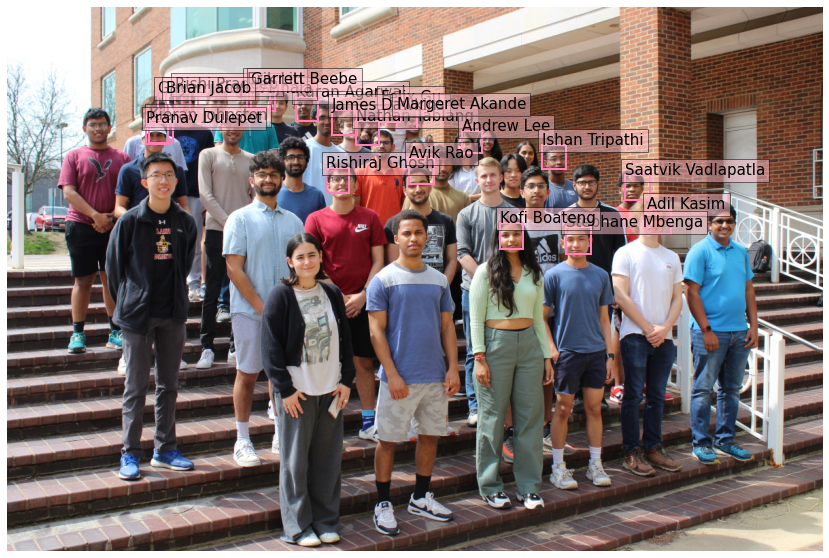

In [44]:
plot_bbs_with_labels(fnamea, res_dfa)

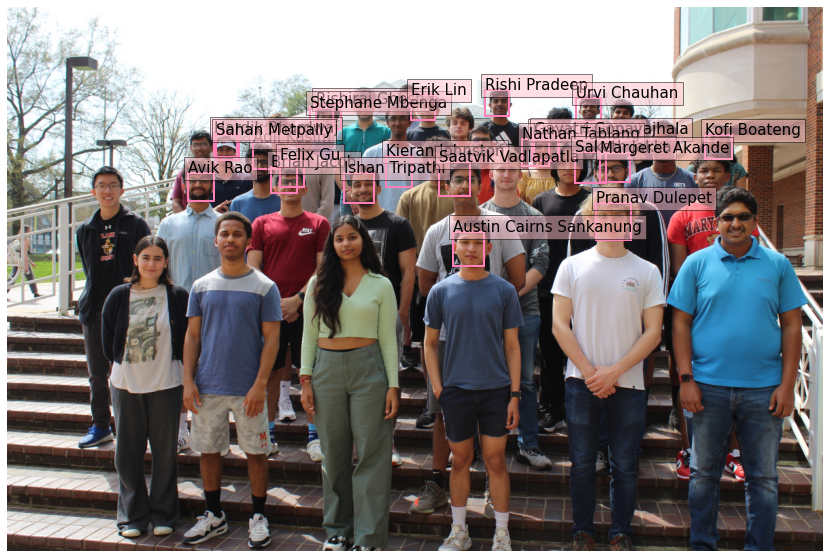

In [45]:
plot_bbs_with_labels(fnameb, res_dfb)

In [46]:
sample = pd.read_csv('/kaggle/input/2022-spring-coml-facial-recognition-competition/sample_submission.csv')

res_df = pd.concat([res_dfa, res_dfb])
res_df = res_df.drop(['person_name', 'scores'], axis=1)

In [47]:
for i in range(len(sample)):
    try:
        xmin = res_dfa[res_dfa['id'] == sample.iloc[i]['id']].iloc[0]['xmin']
    except:
        xmin = 0
    try:
        xmax = res_dfa[res_dfa['id'] == sample.iloc[i]['id']].iloc[0]['xmax']
    except:
        xmax = 0
    try:
        ymin = res_dfa[res_dfa['id'] == sample.iloc[i]['id']].iloc[0]['ymin']
    except:
        ymin = 0
    try:
        ymax = res_dfa[res_dfa['id'] == sample.iloc[i]['id']].iloc[0]['ymax']
    except:
        ymax = 0
    
    sample.at[i, 'xmin'] = xmin
    sample.at[i, 'xmax'] = xmax
    sample.at[i, 'ymin'] = ymin
    sample.at[i, 'ymax'] = ymax
#     sample.iloc[i]['xmin'] = xmin
#     sample.iloc[i]['xmax'] = xmax
#     sample.iloc[i]['ymin'] = xmin
#     sample.iloc[i]['ymax'] = ymax

In [48]:
sample

,id,xmin,xmax,ymin,ymax
0,a1,0.353368,0.380715,0.164412,0.208340
1,a11,0.170199,0.197111,0.212822,0.251918
2,a12,0.000000,0.000000,0.000000,0.000000
3,a14,0.185134,0.214173,0.157437,0.200473
4,a15,0.458085,0.481270,0.174578,0.211257
...,...,...,...,...,...
69,b5,0.000000,0.000000,0.000000,0.000000
70,b6,0.000000,0.000000,0.000000,0.000000
71,b7,0.000000,0.000000,0.000000,0.000000
72,b8,0.000000,0.000000,0.000000,0.000000


In [49]:
sample.to_csv("/kaggle/working/submission.csv", index = False)